In [174]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import os
import matplotlib as mpl
import caiman as cm
from caiman.source_extraction import cnmf
from caiman.utils.utils import download_demo
from caiman.utils.visualization import inspect_correlation_pnr
from caiman.source_extraction.cnmf import params as params
from caiman.source_extraction.cnmf.deconvolution import constrained_foopsi
from caiman.source_extraction.cnmf.deconvolution import constrained_oasisAR2

def Okada_filter(trace):
    """Trace is a list.
    This will apply Okada filter to it as described in Ishikawa et al, STAR Protocols 2020"""
    x=trace.copy()
    M=np.mean(x)
    SD=np.std(x)
    T=len(x)
    for t in range(2, T-1):
        Z=abs(x[t+1]-M)/SD
        if (x[t]-x[t+1])*(x[t]-x[t+1])>0:
            x[t]=(x[t-1]+Z*x[t]+x[t+1])/(2+Z)
    return x

def subtract_baseline(trace, order):
    x=np.linspace(0,len(trace)*0.05,len(trace))
    p = np.poly1d(np.polyfit(x, trace, int(order)))
    return p

def dFF(trace):
    """Trace is a list.
    This will calculate deltaF/F0"""
    x=trace.copy()
    M=np.mean(trace)
    T=len(trace)
    for t in range(0, T):
        x[t]=(trace[t]-M)/M
    return x


def process(trace, polynomial_order=10, Okada_order=1):
    """Trace is a list.
    This will subtract the background with a nth order polynomial and apply Okada filter (m interactions)
    
    n=polynomial_order (default is 10)
    m=number of consecutive Okada iteraction (default is 4)
    
    """
    x=trace.tolist().copy()
    baseline=subtract_baseline(x,polynomial_order)
    
    t = np.linspace(0, len(x)*0.05,len(x))
    
    x = [a - b for a, b in zip(x, baseline(t))]

    for i in range(Okada_order):
        
        x=Okada_filter(x)
        
    return x    
   
framerate=10 #Hz for interframe time 50ms
out_folder=r'C:\Users\fgobbo\OneDrive - University of Edinburgh\2023 - AD Project\Calcium imaging\Out'

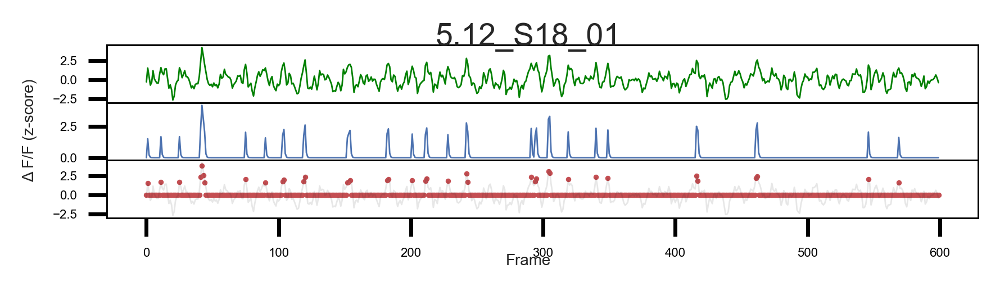

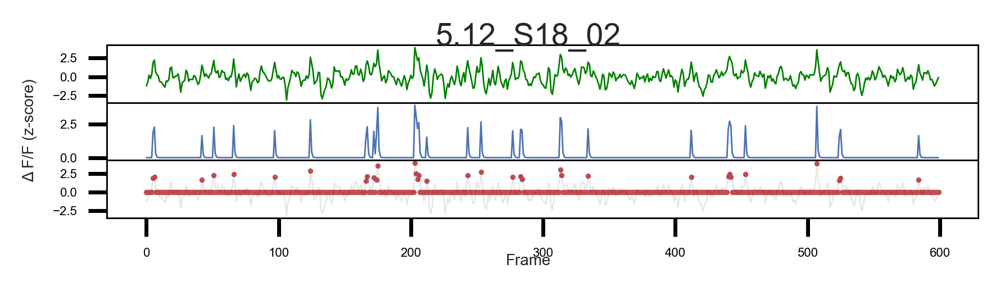

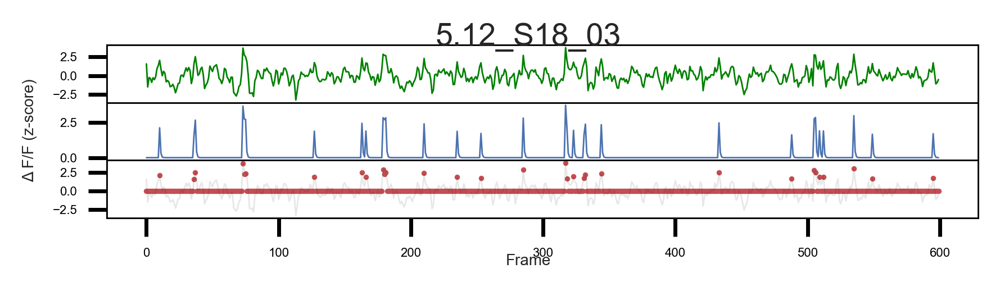

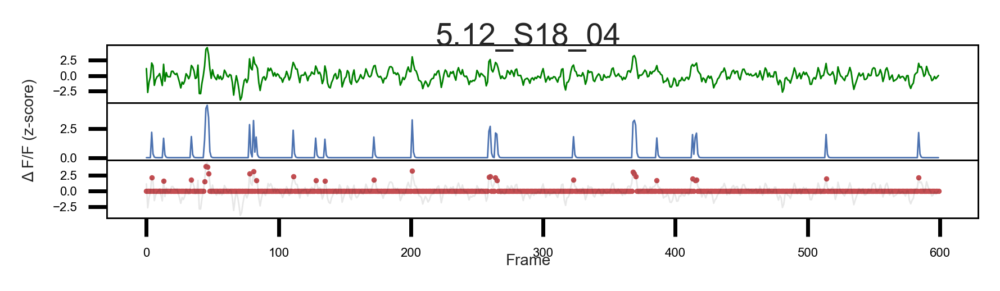

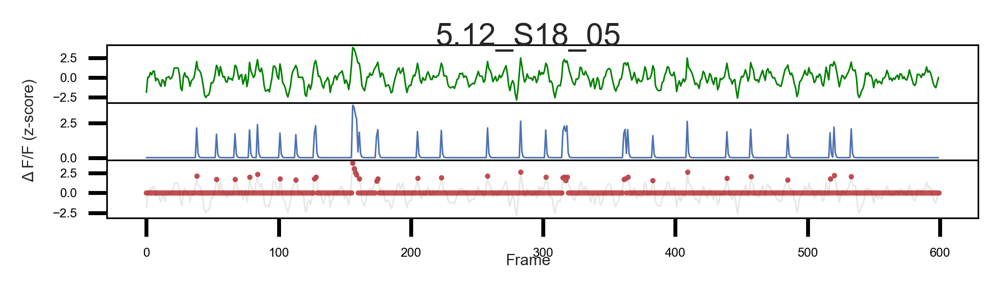

...

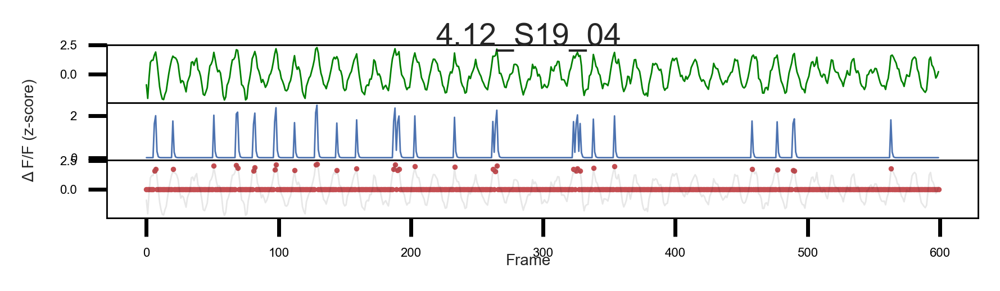

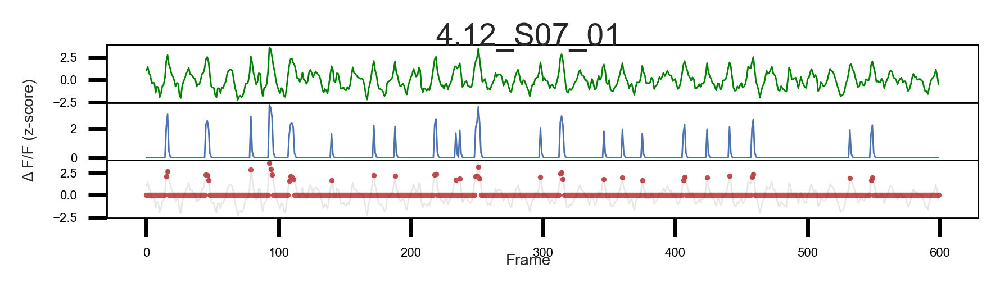

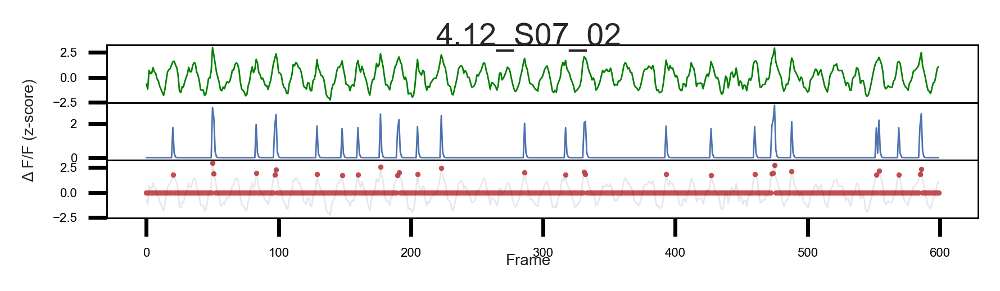

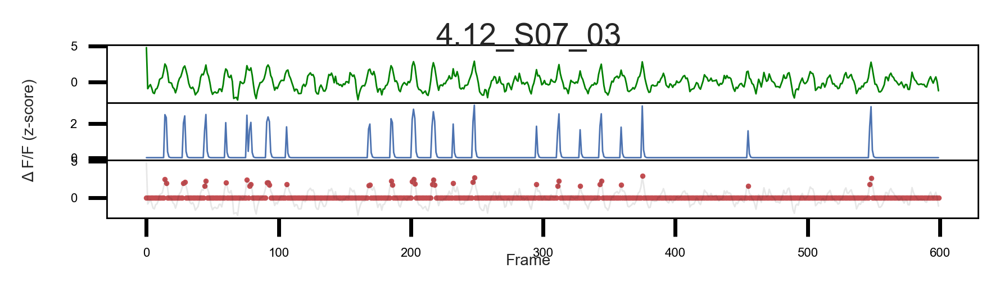

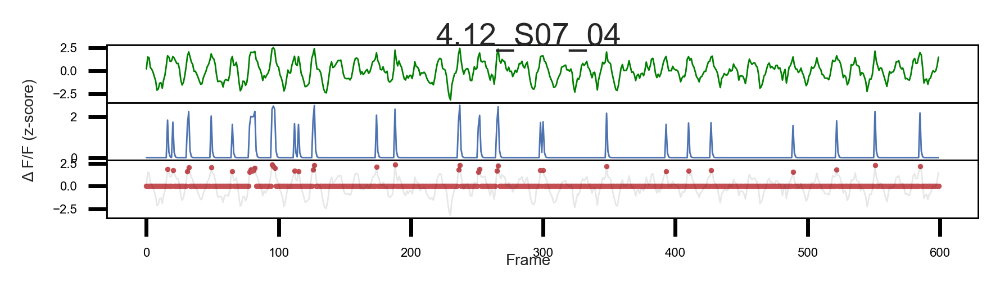

In [187]:
s_min=1.5

#Select PRE ROIs


folder=r'C:\Users\fgobbo\OneDrive - University of Edinburgh\2023 - AD Project\Calcium imaging'

file="7b.csv"


df=pd.read_csv(os.path.join(folder, file))
df=df.iloc[:, 1:]

"""for column in df.columns:
    if column[:4]!='Mean' :
        df=df.drop(column, axis=1)
    elif column[:4]=='Mean' :
        df=df.rename(columns={column:'ROI'+column[4:]})"""
        
df2=df.iloc[:600, :].copy()
df2=df2.fillna(0)

for column in df2.columns:
    df2[column]=dFF(df2[column]) #calculates Delta F/F
    df2[column]=process(df2[column]) # subtracts background and filters noise

cells=df.columns

from matplotlib import gridspec
from sklearn.preprocessing import normalize


#plotting params
mpl.rcParams['axes.facecolor'] = 'white'
mpl.rcParams['axes.edgecolor'] = 'black'
mpl.rcParams['axes.linewidth'] = '0.5'
mpl.rcParams['axes.labelsize'] = '8'
mpl.rcParams['axes.labelcolor'] = 'black'
mpl.rcParams['xtick.color'] = 'black'
mpl.rcParams['xtick.labelsize'] = '4'
mpl.rcParams['ytick.labelsize'] = '4'
mpl.rcParams['ytick.color'] = 'black'

bl=None
c1=None                               #initial calcium concentation (value)
g=None
sn=10                                 #noise SD
p=1
method_deconvolution='oasis'
bas_nonneg=True                       #baseline estimation
noise_range=[0.25, 0.75]              #frquency range to estimate noise
noise_method='logmexp'                #method to estimate noise
lags=5
fudge_factor=.99
verbosity=False
solvers=None
optimize_g=5
#s_min=1 #if z-scored use s_min=2.5 equivalent to 2.5SD ; elsse use s_min between .1 and .25 (usually .2)

#--------------------------------------

traces_7b=[]

trace_dlc = np.array(df2.values.astype(float)).transpose()[:]
cells_tv = cells[:]
all_events = []
all_events_count=[]
all_events_frequency=[]
for cell in range(len(trace_dlc)):

     raw_trace_pure = trace_dlc[cell]
     raw_trace = np.array(raw_trace_pure)/max(np.array(raw_trace_pure)) #If we want traces between 0 and 1 (OPTIONAL)
     raw_trace = (raw_trace - np.mean(raw_trace))/np.std(raw_trace) #z-score normalised

     #OASIS function run through
     events = constrained_foopsi(raw_trace,
                                 bl=bl, 
                                 c1=c1,
                                 g=g, 
                                 sn=sn,
                                 p=p,
                                 method_deconvolution=method_deconvolution,
                                 bas_nonneg=bas_nonneg,
                                 noise_range=noise_range,
                                 noise_method=noise_method,
                                 lags=lags,
                                 fudge_factor=fudge_factor,
                                 verbosity=verbosity,
                                 solvers=solvers,
                                 optimize_g=optimize_g,
                                 s_min=s_min)
                             
 
     all_events.append(events[5])
     all_events_frequency.append(np.count_nonzero(events[5])/len(events[5])*framerate)
     all_events_count.append(np.count_nonzero(events[5]))

    
    
     #Visualising data
     fig, axs = plt.subplots(3, 1, figsize=(5,1), dpi=400, facecolor='w', edgecolor='k' )
     gs = gridspec.GridSpec(3, 1, height_ratios=[1,1,1], )
     fig.suptitle(cells_tv[cell], fontsize=10)

     for ax in fig.get_axes():
         ax.tick_params(bottom=False, labelbottom=False, left=False, labelleft=False)
    
     #Raw traces
     axs[0] = plt.subplot(gs[0])
     axs[0] = plt.plot( raw_trace, c='green', linewidth=.5)
    
     #OASIS noise consideration
     axs[1] = plt.subplot(gs[1])
     axs[1] = plt.plot(events[0], c='b', linewidth=.5)
     
     #Events plotted on raw trace
     axs[2] = plt.subplot(gs[2])
     axs[2] = plt.plot(raw_trace, c='k', alpha=0.1, linewidth=.5)
     axs[2] = plt.scatter( np.arange(0,len(events[5]),1),events[5], c='r', s=.5)
    
     fig.text(0.5, -0.1, 'Frame', ha='center', fontsize=5)
     fig.text(0.05, 0.5, u'Δ F/F (z-score)', va='center', rotation='vertical', fontsize=5)

     fig=ax.get_figure()
     fig.savefig(os.path.join(out_folder, '7b_'+df2.columns[cell]+'.svg'))
    
     plt.subplots_adjust(wspace=0, hspace=0)
     plt.show()
    
     traces_7b.append([raw_trace_pure, raw_trace, events[5], df2.columns[cell]])

#df_events=pd.DataFrame(data={'ROI':cells,'PRE_n':all_events_count,'PRE_Hz':all_events_frequency})

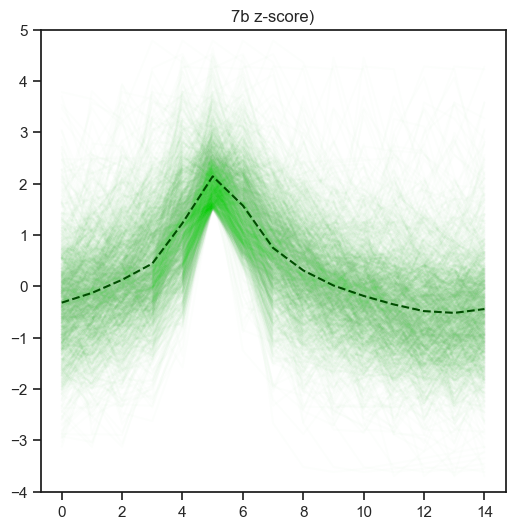

In [188]:
sns.set(rc={'figure.figsize':(6,6), 'axes.facecolor':'white', 'axes.edgecolor':'k', 'ytick.left': True,'xtick.bottom':True})


interval_7b =[]

for k in range(len(traces_7b)):
    events_position = [i for i, val in enumerate(traces_7b[k][2].tolist()) if val !=0]
    for j in events_position:
        plt.plot(traces_7b[k][1][j-5:j+10], alpha=.01, c= '#00cc00')
        interval_7b.append(traces_7b[k][1][j-5:j+10].tolist())
        
df_7b=pd.DataFrame(interval_7b).T
df_7b['AVG']=df_7b[df_7b.columns].mean(axis=1)
average_7b=df_7b.AVG.copy()


plt.plot(average_7b, alpha=1, c= '#004d00', linestyle='--');
plt.title('7b z-score)')
plt.ylim([-4, 5]);

plt.savefig(os.path.join(out_folder, '7b_z.svg'))


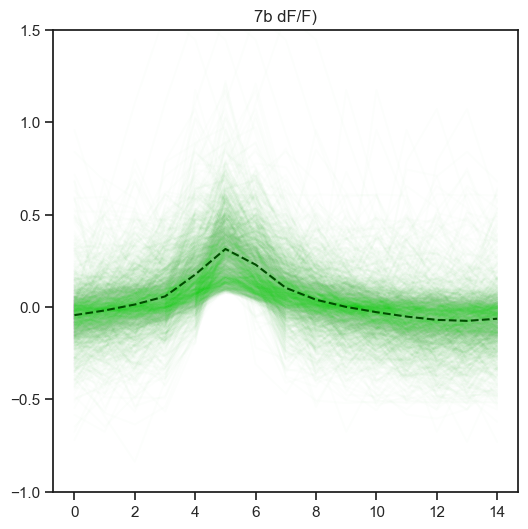

In [189]:
interval_7b =[]
IDs_7b=[]

for k in range(len(traces_7b)):
    events_position = [i for i, val in enumerate(traces_7b[k][2].tolist()) if val !=0]
    for j in events_position:
        plt.plot(traces_7b[k][0][j-5:j+10], alpha=.01, c= '#00cc00')
        interval_7b.append(traces_7b[k][0][j-5:j+10].tolist())
    IDs_7b+=[traces_7b[k][3]]*len(events_position) 
        
df_7b=pd.DataFrame(interval_7b).T
df_7b['AVG']=df_7b[df_7b.columns].mean(axis=1)
average_7b=df_7b.AVG.copy()


plt.plot(average_7b, alpha=1, c= '#004d00', linestyle='--')
plt.title('7b dF/F)')

plt.ylim([-1, 1.5]);

plt.savefig(os.path.join(out_folder, '7b_dFF.svg'))


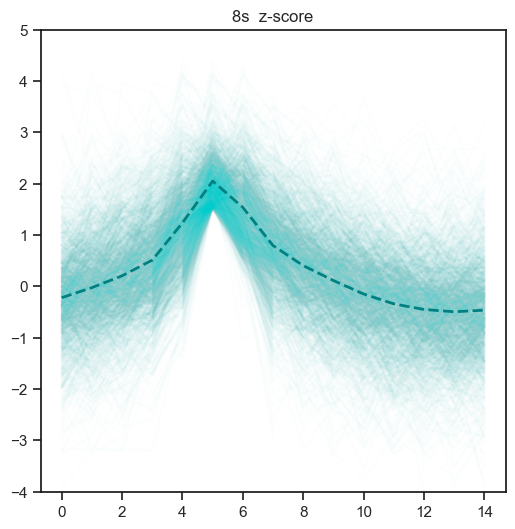

In [190]:
sns.set(rc={'figure.figsize':(6,6), 'axes.facecolor':'white', 'axes.edgecolor':'k', 'ytick.left': True,'xtick.bottom':True})

interval_8s =[]

for k in range(len(traces_8s)):
    events_position = [i for i, val in enumerate(traces_8s[k][2].tolist()) if val !=0]
    for j in events_position:
        plt.plot(traces_8s[k][1][j-5:j+10], alpha=.01, c= '#00cccc')
        interval_8s.append(traces_8s[k][1][j-5:j+10].tolist())
        
df_8s=pd.DataFrame(interval_8s).T
df_8s['AVG']=df_8s[df_8s.columns].mean(axis=1)
average_8s=df_8s.AVG.copy()


plt.plot(average_8s, alpha=1, c= '#008080', linestyle='--', linewidth=2)
plt.title('8s  z-score')
plt.ylim([-4, 5]);

plt.savefig(os.path.join(out_folder, '8s_z.svg'))


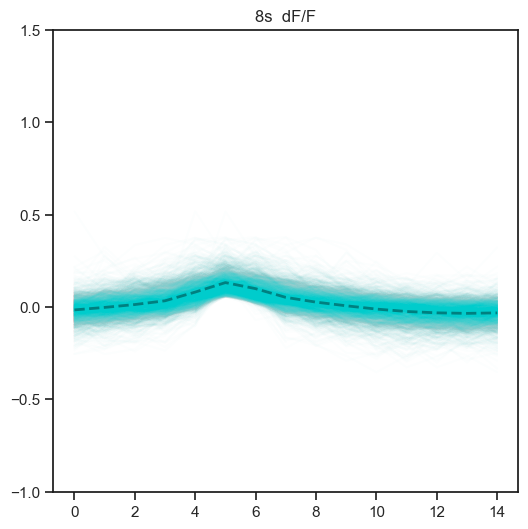

In [191]:
interval_8s =[]
IDs_8s=[]

for k in range(len(traces_8s)):
    events_position = [i for i, val in enumerate(traces_8s[k][2].tolist()) if val !=0]
    for j in events_position:
        plt.plot(traces_8s[k][0][j-5:j+10], alpha=.01, c= '#00cccc')
        interval_8s.append(traces_8s[k][0][j-5:j+10].tolist())
    IDs_8s+=[traces_8s[k][3]]*len(events_position) 
    
df_8s=pd.DataFrame(interval_8s).T
df_8s['AVG']=df_8s[df_8s.columns].mean(axis=1)
average_8s=df_8s.AVG.copy()


plt.plot(average_8s, alpha=1, c= '#008080', linestyle='--', linewidth=2)
plt.title('8s  dF/F')
plt.ylim([-1, 1.5]);

plt.savefig(os.path.join(out_folder, '8s_dFF.svg'))


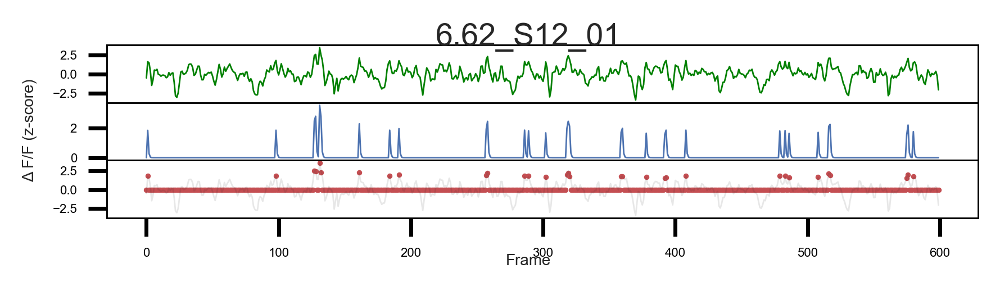

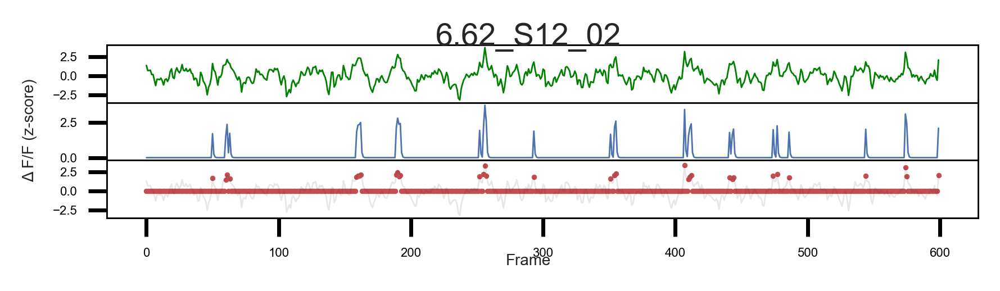

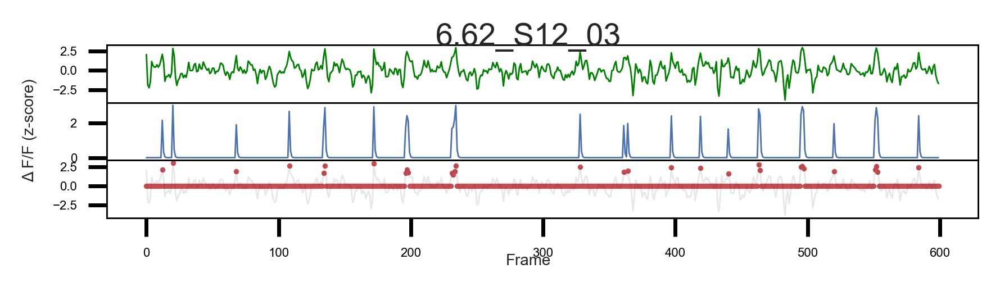

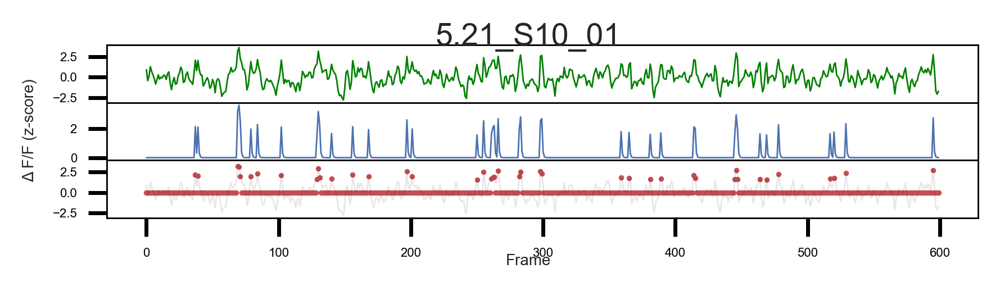

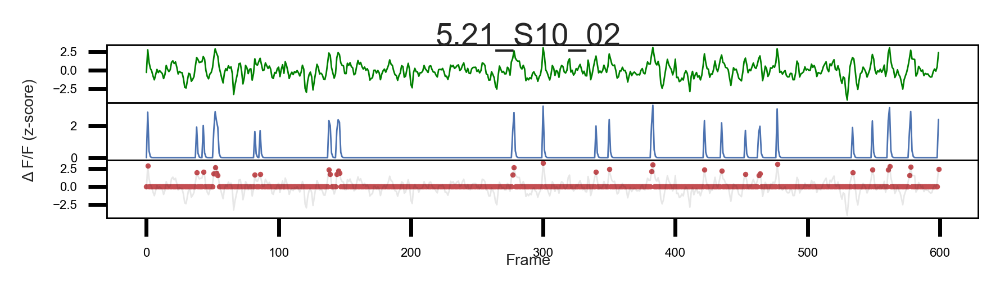

...

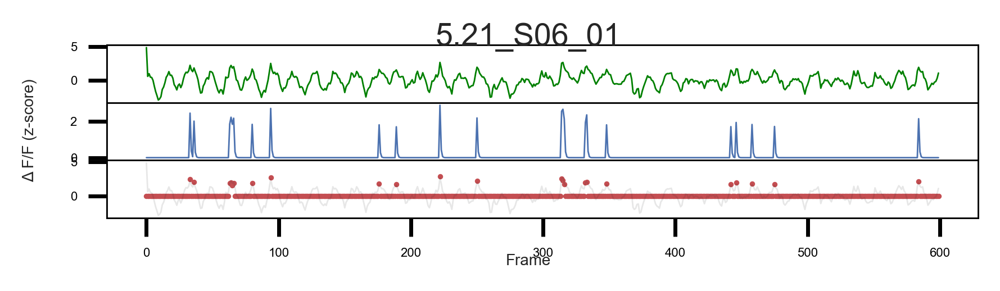

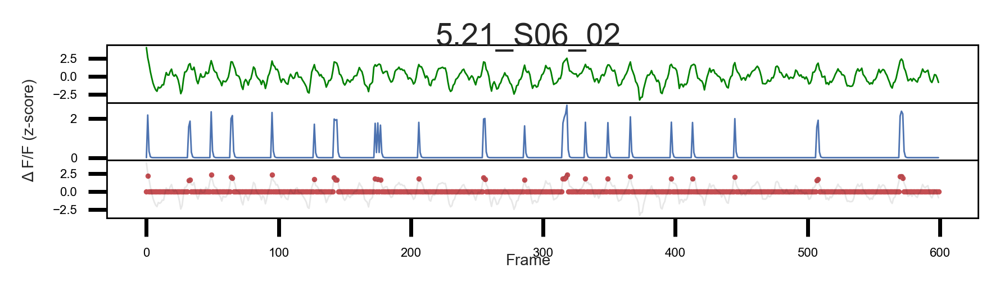

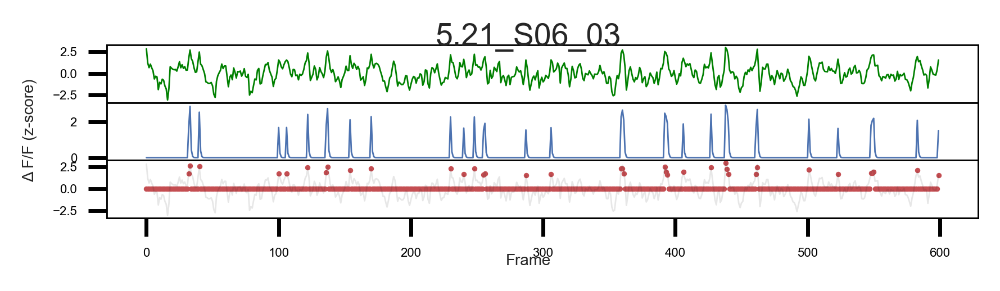

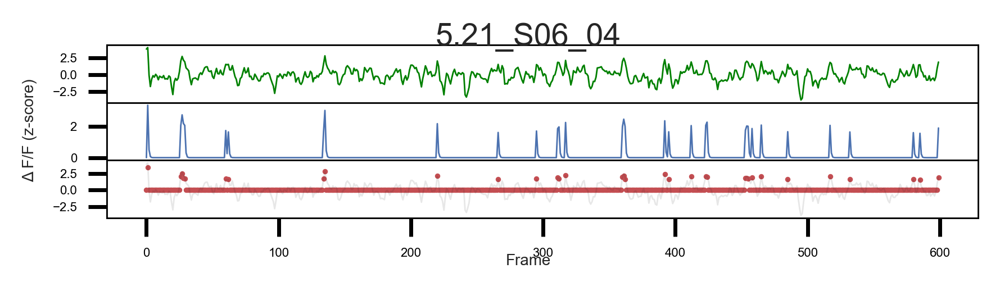

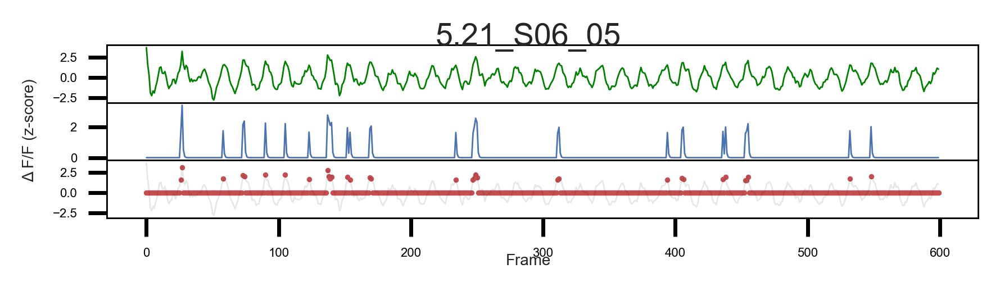

In [192]:
#Select PRE ROIs


folder=r'C:\Users\fgobbo\OneDrive - University of Edinburgh\2023 - AD Project\Calcium imaging'

file="6s.csv"


df=pd.read_csv(os.path.join(folder, file))
df=df.iloc[:, 1:]

"""for column in df.columns:
    if column[:4]!='Mean' :
        df=df.drop(column, axis=1)
    elif column[:4]=='Mean' :
        df=df.rename(columns={column:'ROI'+column[4:]})"""
        
df2=df.iloc[:600, :].copy()
df2=df2.fillna(0)

for column in df2.columns:
    df2[column]=dFF(df2[column]) #calculates Delta F/F
    df2[column]=process(df2[column]) # subtracts background and filters noise

cells=df.columns

from matplotlib import gridspec
from sklearn.preprocessing import normalize


#plotting params
mpl.rcParams['axes.facecolor'] = 'white'
mpl.rcParams['axes.edgecolor'] = 'black'
mpl.rcParams['axes.linewidth'] = '0.5'
mpl.rcParams['axes.labelsize'] = '8'
mpl.rcParams['axes.labelcolor'] = 'black'
mpl.rcParams['xtick.color'] = 'black'
mpl.rcParams['xtick.labelsize'] = '4'
mpl.rcParams['ytick.labelsize'] = '4'
mpl.rcParams['ytick.color'] = 'black'

bl=None
c1=None                               #initial calcium concentation (value)
g=None
sn=10                                 #noise SD
p=1
method_deconvolution='oasis'
bas_nonneg=True                       #baseline estimation
noise_range=[0.25, 0.75]              #frquency range to estimate noise
noise_method='logmexp'                #method to estimate noise
lags=5
fudge_factor=.99
verbosity=False
solvers=None
optimize_g=5
#s_min=1 #if z-scored use s_min=2.5 equivalent to 2.5SD ; elsse use s_min between .1 and .25 (usually .2)

#--------------------------------------

traces_6s=[]

trace_dlc = np.array(df2.values.astype(float)).transpose()[:]
cells_tv = cells[:]
all_events = []
all_events_count=[]
all_events_frequency=[]
for cell in range(len(trace_dlc)):

     raw_trace_pure = trace_dlc[cell]
     raw_trace = np.array(raw_trace_pure)/max(np.array(raw_trace_pure)) #If we want traces between 0 and 1 (OPTIONAL)
     raw_trace = (raw_trace - np.mean(raw_trace))/np.std(raw_trace) #z-score normalised

     #OASIS function run through
     events = constrained_foopsi(raw_trace,
                                 bl=bl, 
                                 c1=c1,
                                 g=g, 
                                 sn=sn,
                                 p=p,
                                 method_deconvolution=method_deconvolution,
                                 bas_nonneg=bas_nonneg,
                                 noise_range=noise_range,
                                 noise_method=noise_method,
                                 lags=lags,
                                 fudge_factor=fudge_factor,
                                 verbosity=verbosity,
                                 solvers=solvers,
                                 optimize_g=optimize_g,
                                 s_min=s_min)
                             
 
     all_events.append(events[5])
     all_events_frequency.append(np.count_nonzero(events[5])/len(events[5])*framerate)
     all_events_count.append(np.count_nonzero(events[5]))

    
    
     #Visualising data
     fig, axs = plt.subplots(3, 1, figsize=(5,1), dpi=400, facecolor='w', edgecolor='k' )
     gs = gridspec.GridSpec(3, 1, height_ratios=[1,1,1], )
     fig.suptitle(cells_tv[cell], fontsize=10)

     for ax in fig.get_axes():
         ax.tick_params(bottom=False, labelbottom=False, left=False, labelleft=False)
    
     #Raw traces
     axs[0] = plt.subplot(gs[0])
     axs[0] = plt.plot( raw_trace, c='green', linewidth=.5)
    
     #OASIS noise consideration
     axs[1] = plt.subplot(gs[1])
     axs[1] = plt.plot(events[0], c='b', linewidth=.5)
     
     #Events plotted on raw trace
     axs[2] = plt.subplot(gs[2])
     axs[2] = plt.plot(raw_trace, c='k', alpha=0.1, linewidth=.5)
     axs[2] = plt.scatter( np.arange(0,len(events[5]),1),events[5], c='r', s=.5)
    
     fig.text(0.5, -0.1, 'Frame', ha='center', fontsize=5)
     fig.text(0.05, 0.5, u'Δ F/F (z-score)', va='center', rotation='vertical', fontsize=5)

     fig=ax.get_figure()
     fig.savefig(os.path.join(out_folder, '6s_'+df2.columns[cell]+'.svg'))
    
     plt.subplots_adjust(wspace=0, hspace=0)
     plt.show()
    
     traces_6s.append([raw_trace_pure, raw_trace, events[5], df2.columns[cell]])

#df_events=pd.DataFrame(data={'ROI':cells,'PRE_n':all_events_count,'PRE_Hz':all_events_frequency})

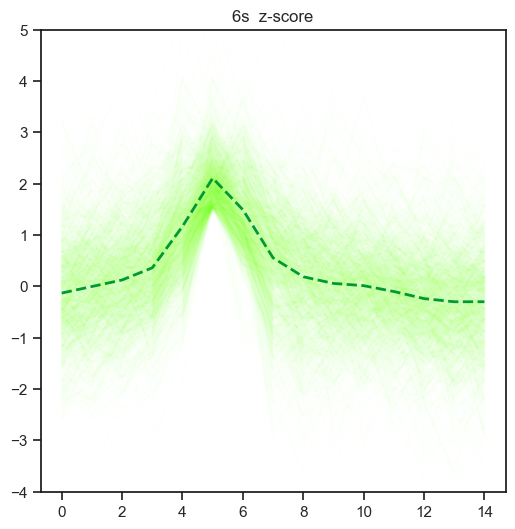

In [193]:
sns.set(rc={'figure.figsize':(6,6), 'axes.facecolor':'white', 'axes.edgecolor':'k', 'ytick.left': True,'xtick.bottom':True})

interval_6s =[]
IDs_6s=[]

for k in range(len(traces_6s)):
    events_position = [i for i, val in enumerate(traces_6s[k][2].tolist()) if val !=0]
    for j in events_position:
        plt.plot(traces_6s[k][1][j-5:j+10], alpha=.01, c= '#80ff00')
        interval_6s.append(traces_6s[k][1][j-5:j+10].tolist())
    IDs_6s+=[traces_6s[k][3]]*len(events_position)
        
df_6s=pd.DataFrame(interval_6s).T
df_6s['AVG']=df_6s[df_6s.columns].mean(axis=1)
average_6s=df_6s.AVG.copy()


plt.plot(average_6s, alpha=1, c= '#009933', linestyle='--', linewidth=2)
plt.title('6s  z-score')
plt.ylim([-4, 5]);

plt.savefig(os.path.join(out_folder, '6s_z.svg'))


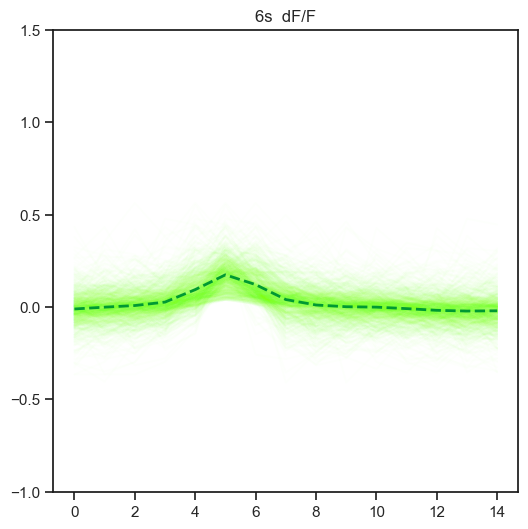

In [194]:
interval_6s =[]

for k in range(len(traces_6s)):
    events_position = [i for i, val in enumerate(traces_6s[k][2].tolist()) if val !=0]
    for j in events_position:
        plt.plot(traces_6s[k][0][j-5:j+10], alpha=.01, c= '#80ff00')
        interval_6s.append(traces_6s[k][0][j-5:j+10].tolist())
        
df_6s=pd.DataFrame(interval_6s).T
df_6s['AVG']=df_6s[df_6s.columns].mean(axis=1)
average_6s=df_6s.AVG.copy()


plt.plot(average_6s, alpha=1, c= '#009933', linestyle='--', linewidth=2)
plt.title('6s  dF/F')
plt.ylim([-1,1.5]);

plt.savefig(os.path.join(out_folder, '6s_dFF.svg'))


In [195]:
DF=pd.DataFrame(data=df_6s.iloc[5, 1:-1].copy())#, columns=['Peak'])
DF.columns=['Peak']
DF['GCAMP']='6s'
DF['ID']=IDs_6s[:-1]

DF1=pd.DataFrame(data=df_7b.iloc[5, 1:-1].copy())#, columns=['Peak'])
DF1.columns=['Peak']
DF1['GCAMP']='7b'
DF1['ID']=IDs_7b[:-1]

DF2=pd.DataFrame(data=df_8s.iloc[5, 1:-1].copy())#, columns=['Peak'])
DF2.columns=['Peak']
DF2['GCAMP']='8s'
DF2['ID']=IDs_8s[:-1]

DF=pd.concat([DF, DF1, DF2]).reset_index(drop=True)



In [209]:
DF[['Slice', 'Series', 'ROI']] = DF['ID'].str.split('_', expand=True, n=2)
DF['Slice2']= DF['Slice']
DF[['Animal', 'Slice N']] = DF['Slice2'].str.split('.', expand=True, n=1)


In [228]:
DF.groupby(['GCAMP', 'Animal']).count()

C:\Users\fgobbo\AppData\Local\Temp\ipykernel_19912\1894618890.py:1: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  DF.groupby(['GCAMP', 'Animal']).count()


Peak    ID  Slice  Series   ROI  Slice2  Slice N
GCAMP Animal                                                  
7b    1          0     0      0       0     0       0        0
      2          0     0      0       0     0       0        0
      4        488   491    491     491   491     491      491
      5        806   815    815     815   815     815      815
      6          0     0      0       0     0       0        0
      7          0     0      0       0     0       0        0
      8        107   108    108     108   108     108      108
8s    1        280   285    285     285   285     285      285
      2          0     0      0       0     0       0        0
      4        136   138    138     138   138     138      138
      5         35    35     35      35    35      35       35
      6          0     0      0       0     0       0        0
      7       1225  1245   1245    1245  1245    1245     1245
      8          0     0      0       0     0       0        0
6s    1          0     0      0       0     0       0        0
      2         34    34     34      34    34      34       34
      4          0     0      0       0     0       0        0
      5        868   879    879     879   879     879      879
      6         96    96     96      96    96      96       96
      7          0     0      0       0     0       0        0
      8          0     0      0       0     0       0        0

In [208]:
DF.Slice.unique()

array(['62', '21', '41', '11', '12', '22', '2', '7'], dtype=object)

In [216]:
DF["GCAMP"] = pd.Categorical(DF["GCAMP"], categories=["7b","8s", "6s"])  # '8s' is now the baseline


C:\Users\fgobbo\AppData\Local\Temp\ipykernel_19912\2001238954.py:20: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(['GCaMP6s', 'jGCaMP7b', 'jGCaMP8s'])


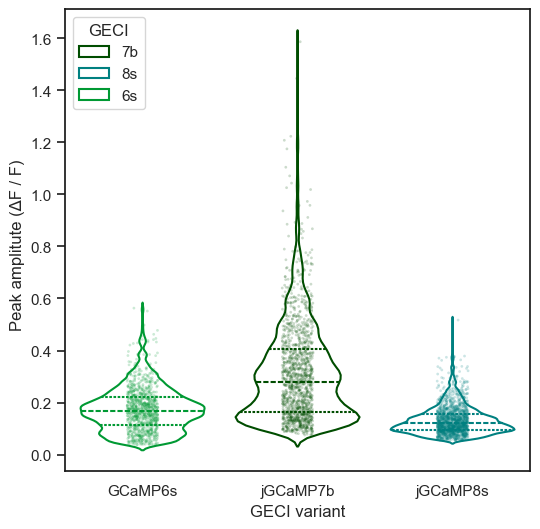

In [234]:
sns.set(rc={'figure.figsize':(6,6), 'axes.facecolor':'white', 'axes.edgecolor':'k', 'ytick.left': True,})

palette={x: "#008080" if x == "8s" else "#009933" if x=='6s' else '#004d00' for x in DF['GCAMP'].unique()}
data=DF.copy()


ax=sns.violinplot(data=data,x='GCAMP', y='Peak', order=['6s', '7b', '8s'],hue='GCAMP',
                 bw_adjust=.5, fill =False,inner='quart',palette=palette, legend=True)#, cut=0, order=['-', '+'])# palette = pal_time)
ax=sns.stripplot(data=data,x='GCAMP', y='Peak', order=['6s', '7b', '8s'],hue='GCAMP', 
                s=2, dodge=False,  alpha=.2,legend=False,palette=palette)




ax.legend(title='GECI',loc='upper left')

ax.set_title('')
ax.set_ylabel('Peak amplitute (ΔF / F)  ')
ax.set_xlabel('GECI variant')
ax.set_xticklabels(['GCaMP6s', 'jGCaMP7b', 'jGCaMP8s'])

ax.yaxis.tick_left()

fig=ax.get_figure()
fig.savefig(os.path.join(out_folder, 'GECI peak amplitude.svg'))

In [223]:
import scipy.stats 
from statsmodels.stats.multicomp import pairwise_tukeyhsd
import statsmodels.api as sm
import statsmodels.formula.api as smf


data=DF.dropna()
md = smf.mixedlm("Peak ~ GCAMP", data, groups=data["Animal"])
mdf = md.fit(method=["lbfgs"])
print(mdf.summary())

         Mixed Linear Model Regression Results
Model:            MixedLM Dependent Variable: Peak     
No. Observations: 4075    Method:             REML     
No. Groups:       7       Scale:              0.0133   
Min. group size:  34      Log-Likelihood:     2995.2465
Max. group size:  1709    Converged:          Yes      
Mean group size:  582.1                                
-------------------------------------------------------
            Coef.  Std.Err.    z    P>|z| [0.025 0.975]
-------------------------------------------------------
Intercept    0.316    0.045   7.080 0.000  0.229  0.404
GCAMP[T.8s] -0.221    0.010 -22.790 0.000 -0.240 -0.202
GCAMP[T.6s] -0.083    0.006 -14.856 0.000 -0.094 -0.072
Group Var    0.014    0.070                            



In [232]:
DF

,Peak,GCAMP,ID,Slice,Series,ROI,Animal,Slice2,Slice N
0,0.082855,6s,6.62_S12_01,6.62,S12,01,6,6.62,62
1,0.113070,6s,6.62_S12_01,6.62,S12,01,6,6.62,62
2,0.119069,6s,6.62_S12_01,6.62,S12,01,6,6.62,62
3,0.160034,6s,6.62_S12_01,6.62,S12,01,6,6.62,62
4,0.116317,6s,6.62_S12_01,6.62,S12,01,6,6.62,62
...,...,...,...,...,...,...,...,...,...
4121,0.236502,8s,7.21_S07_05,7.21,S07,05,7,7.21,21
4122,0.184449,8s,7.21_S07_05,7.21,S07,05,7,7.21,21
4123,0.226441,8s,7.21_S07_05,7.21,S07,05,7,7.21,21
4124,0.226996,8s,7.21_S07_05,7.21,S07,05,7,7.21,21


In [233]:
DF.Slice2.unique()

array(['6.62', '5.21', '5.41', '2.11', '5.12', '5.22', '8.22', '4.12',
       '7.21', '4.2', '1.7'], dtype=object)